# Environment Setup

## Libraries

In [ ]:
!pip install -q ultralytics

In [ ]:

import os
import sys
import cv2
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yaml

from pathlib import Path

import importlib.util
import torch



## Cloning Branch

In [ ]:
# Clone the CV project from the feature branch

!git clone -b feature/cv-yolo-detection \
https://github.com/Govind-2004/AI_Adaptive_Traffic_Analysis_and_Signal_Optimization.git

fatal: destination path 'AI_Adaptive_Traffic_Analysis_and_Signal_Optimization' already exists and is not an empty directory.


In [ ]:
PROJECT_DIR = "/content/AI_Adaptive_Traffic_Analysis_and_Signal_Optimization"

print("Project path:", PROJECT_DIR)

Project path: /content/AI_Adaptive_Traffic_Analysis_and_Signal_Optimization


In [ ]:
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Inspect the inputs

In [ ]:
video_paths = {
    "north": "/content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/North.mp4",
    "south": "/content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/South.mp4",
    "east":  "/content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/East.mp4",
    "west":  "/content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/West.mp4"
}

for direction, path in video_paths.items():
    cap = cv2.VideoCapture(path)

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    cap.release()

    duration = frames / fps if fps > 0 else 0

    print(f"\n{direction.upper()}")
    print(f"Resolution : {width} x {height}")
    print(f"FPS        : {fps:.2f}")
    print(f"Frames     : {frames}")
    print(f"Duration   : {duration:.2f} seconds")


NORTH
Resolution : 2160 x 3840
FPS        : 30.00
Frames     : 923
Duration   : 30.77 seconds

SOUTH
Resolution : 3580 x 2160
FPS        : 25.00
Frames     : 752
Duration   : 30.08 seconds

EAST
Resolution : 2296 x 2160
FPS        : 25.00
Frames     : 755
Duration   : 30.20 seconds

WEST
Resolution : 2160 x 2478
FPS        : 25.00
Frames     : 751
Duration   : 30.04 seconds


# Determine ROI coordinates

ROI is manually determined since different cases(road/approach) have different ROI dimensions

## North ROI

Frame size: 2160 x 3840
Frame used: 461


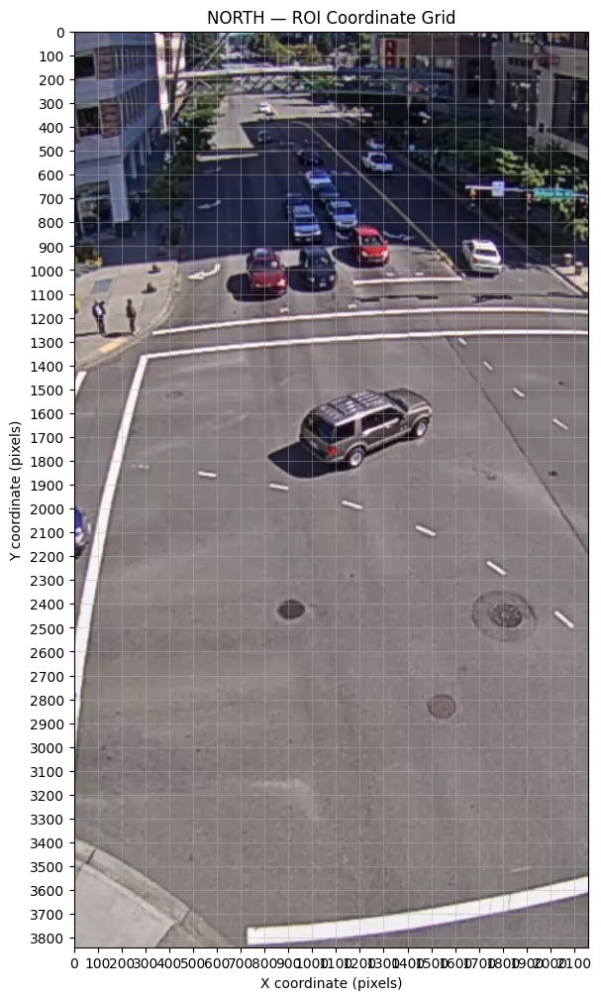

In [ ]:
north_path = video_paths["north"]

cap = cv2.VideoCapture(north_path)

# Take a frame from around the middle of the video
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
middle_frame = total_frames // 2

cap.set(cv2.CAP_PROP_POS_FRAMES, middle_frame)
ret, frame = cap.read()

cap.release()

if not ret:
    raise RuntimeError("Could not read the North video frame.")

# OpenCV uses BGR, matplotlib uses RGB
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

height, width = frame.shape[:2]

print(f"Frame size: {width} x {height}")
print(f"Frame used: {middle_frame}")

plt.figure(figsize=(14, 12))
plt.imshow(frame_rgb)

# Grid spacing
grid_x = 100
grid_y = 100

plt.xticks(np.arange(0, width + 1, grid_x))
plt.yticks(np.arange(0, height + 1, grid_y))

plt.grid(True, alpha=0.4)

plt.xlabel("X coordinate (pixels)")
plt.ylabel("Y coordinate (pixels)")
plt.title("NORTH — ROI Coordinate Grid")

plt.show()

In [ ]:
north_roi = [
    (600,300),  # top-left
    (1000, 380),  # top-right
    (1630, 1050),  # bottom-right
    (400, 1150)   # bottom-left
]

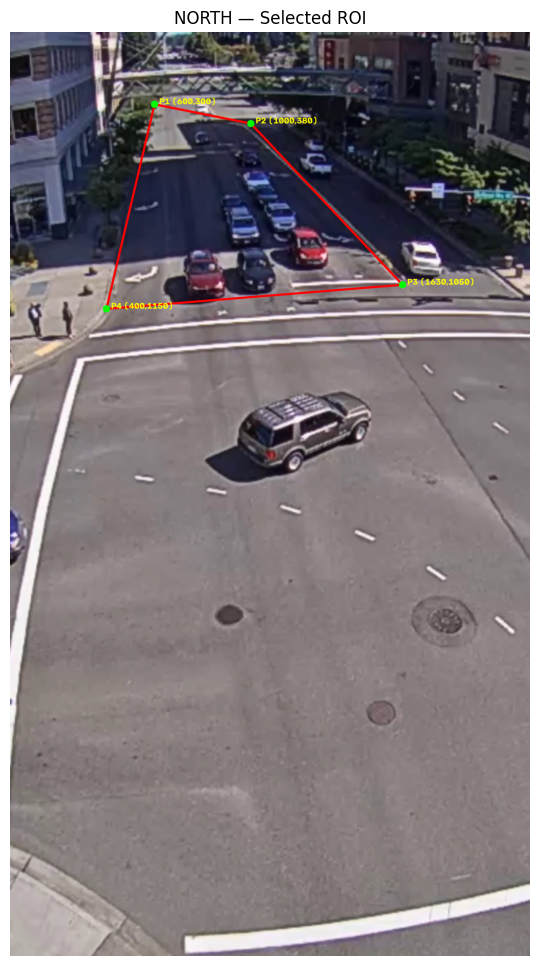

In [ ]:
# Verify the manually selected ROI
# Create polygon
roi_polygon = np.array(north_roi, dtype=np.int32)

# Draw ROI on the frame
roi_frame = frame_rgb.copy()

cv2.polylines(
    roi_frame,
    [roi_polygon],
    isClosed=True,
    color=(255, 0, 0),
    thickness=8
)

# Mark each selected point
for i, (x, y) in enumerate(north_roi, start=1):
    cv2.circle(roi_frame, (x, y), 15, (0, 255, 0), -1)
    cv2.putText(
        roi_frame,
        f"P{i} ({x},{y})",
        (x + 20, y),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        (255, 255, 0),
        3
    )

plt.figure(figsize=(14, 12))
plt.imshow(roi_frame)
plt.axis("off")
plt.title("NORTH — Selected ROI")
plt.show()

## South ROI

Frame size: 3580 x 2160
Frame used: 376


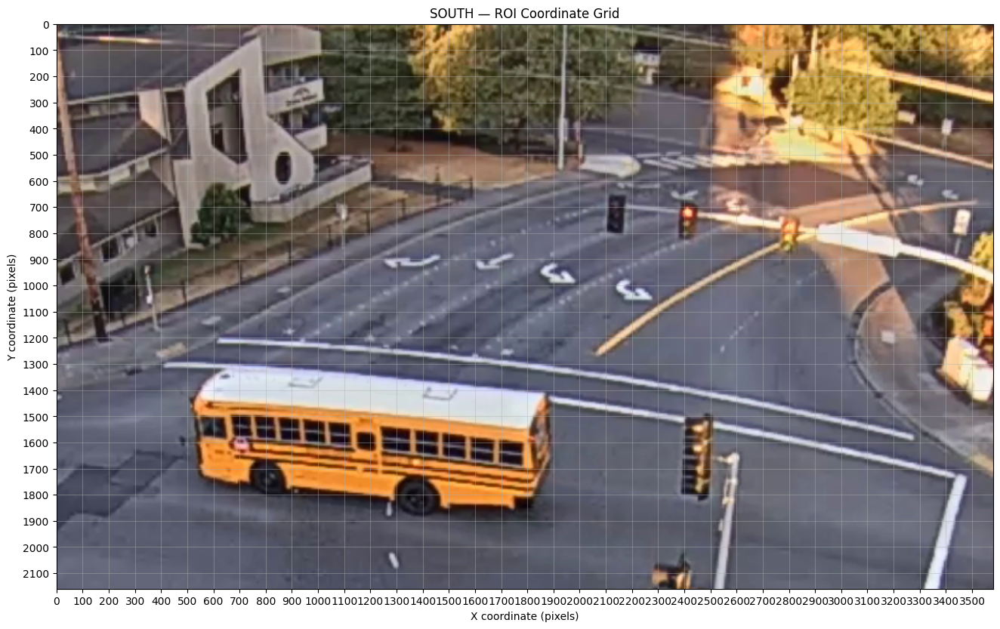

In [ ]:
# Display South video frame with coordinate grid

south_path = video_paths["south"]

cap = cv2.VideoCapture(south_path)

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
middle_frame = total_frames // 2

cap.set(cv2.CAP_PROP_POS_FRAMES, middle_frame)
ret, south_frame = cap.read()

cap.release()

if not ret:
    raise RuntimeError("Could not read the South video frame.")

south_frame_rgb = cv2.cvtColor(south_frame, cv2.COLOR_BGR2RGB)

height, width = south_frame.shape[:2]

print(f"Frame size: {width} x {height}")
print(f"Frame used: {middle_frame}")

plt.figure(figsize=(16, 10))
plt.imshow(south_frame_rgb)

# Grid every 200 pixels
grid_x = 100
grid_y = 100

plt.xticks(np.arange(0, width + 1, grid_x))
plt.yticks(np.arange(0, height + 1, grid_y))

plt.grid(True, alpha=0.4)

plt.xlabel("X coordinate (pixels)")
plt.ylabel("Y coordinate (pixels)")
plt.title("SOUTH — ROI Coordinate Grid")

plt.show()

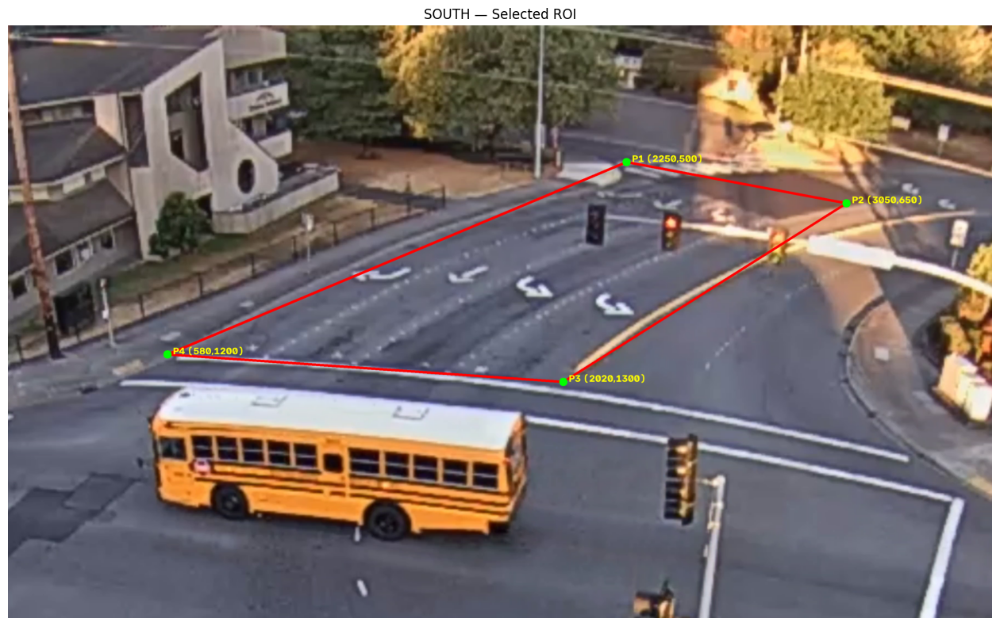

In [ ]:
south_roi = [
    (2250, 500),  # top-left
    (3050, 650),  # top-right
    ( 2020,1300),  # bottom-right
    (580,1200)   # bottom-left
]

south_polygon = np.array(south_roi, dtype=np.int32)

south_roi_frame = south_frame_rgb.copy()

cv2.polylines(
    south_roi_frame,
    [south_polygon],
    isClosed=True,
    color=(255, 0, 0),
    thickness=8
)

for i, (x, y) in enumerate(south_roi, start=1):
    cv2.circle(
        south_roi_frame,
        (x, y),
        15,
        (0, 255, 0),
        -1
    )

    cv2.putText(
        south_roi_frame,
        f"P{i} ({x},{y})",
        (x + 20, y),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        (255, 255, 0),
        3
    )

plt.figure(figsize=(16, 10))
plt.imshow(south_roi_frame)
plt.axis("off")
plt.title("SOUTH — Selected ROI")
plt.show()

## West ROI

Frame size: 2160 x 2478
Frame used: 375


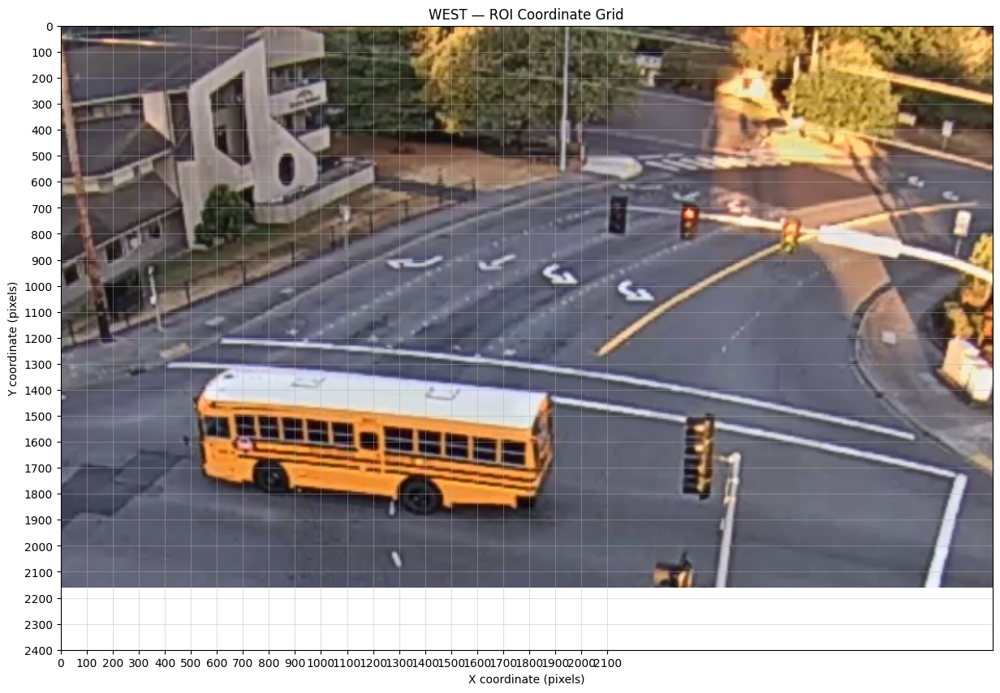

In [ ]:
# Display West video frame with coordinate grid

west_path = video_paths["west"]

cap = cv2.VideoCapture(west_path)

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
middle_frame = total_frames // 2

cap.set(cv2.CAP_PROP_POS_FRAMES, middle_frame)
ret, west_frame = cap.read()

cap.release()

if not ret:
    raise RuntimeError("Could not read the west video frame.")

west_frame_rgb = cv2.cvtColor(west_frame, cv2.COLOR_BGR2RGB)

height, width = west_frame.shape[:2]

print(f"Frame size: {width} x {height}")
print(f"Frame used: {middle_frame}")

plt.figure(figsize=(16, 10))
plt.imshow(south_frame_rgb)

# Grid every 200 pixels
grid_x = 100
grid_y = 100

plt.xticks(np.arange(0, width + 1, grid_x))
plt.yticks(np.arange(0, height + 1, grid_y))

plt.grid(True, alpha=0.4)

plt.xlabel("X coordinate (pixels)")
plt.ylabel("Y coordinate (pixels)")
plt.title("WEST — ROI Coordinate Grid")

plt.show()

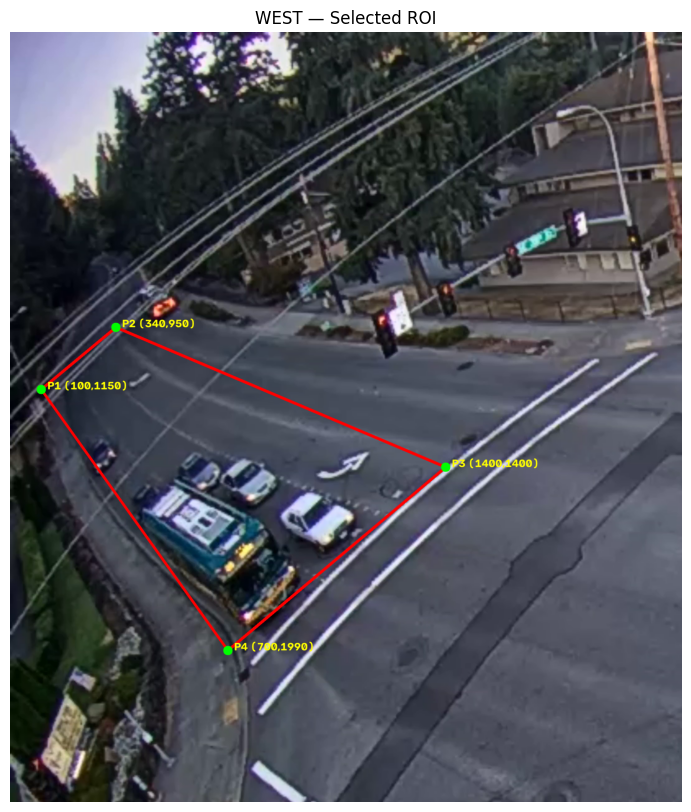

In [ ]:
west_roi = [
    (100, 1150),  # top-left
    (340, 950),  # top-right
    (1400,1400),  # bottom-right
    (700,1990)   # bottom-left
]

west_polygon = np.array(west_roi, dtype=np.int32)

west_roi_frame = west_frame_rgb.copy()

cv2.polylines(
    west_roi_frame,
    [west_polygon],
    isClosed=True,
    color=(255, 0, 0),
    thickness=8
)

for i, (x, y) in enumerate(west_roi, start=1):
    cv2.circle(
        west_roi_frame,
        (x, y),
        15,
        (0, 255, 0),
        -1
    )

    cv2.putText(
        west_roi_frame,
        f"P{i} ({x},{y})",
        (x + 20, y),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        (255, 255, 0),
        3
    )

plt.figure(figsize=(16, 10))
plt.imshow(west_roi_frame)
plt.axis("off")
plt.title("WEST — Selected ROI")
plt.show()

## East ROI

Frame size: 2296 x 2160
Frame used: 377


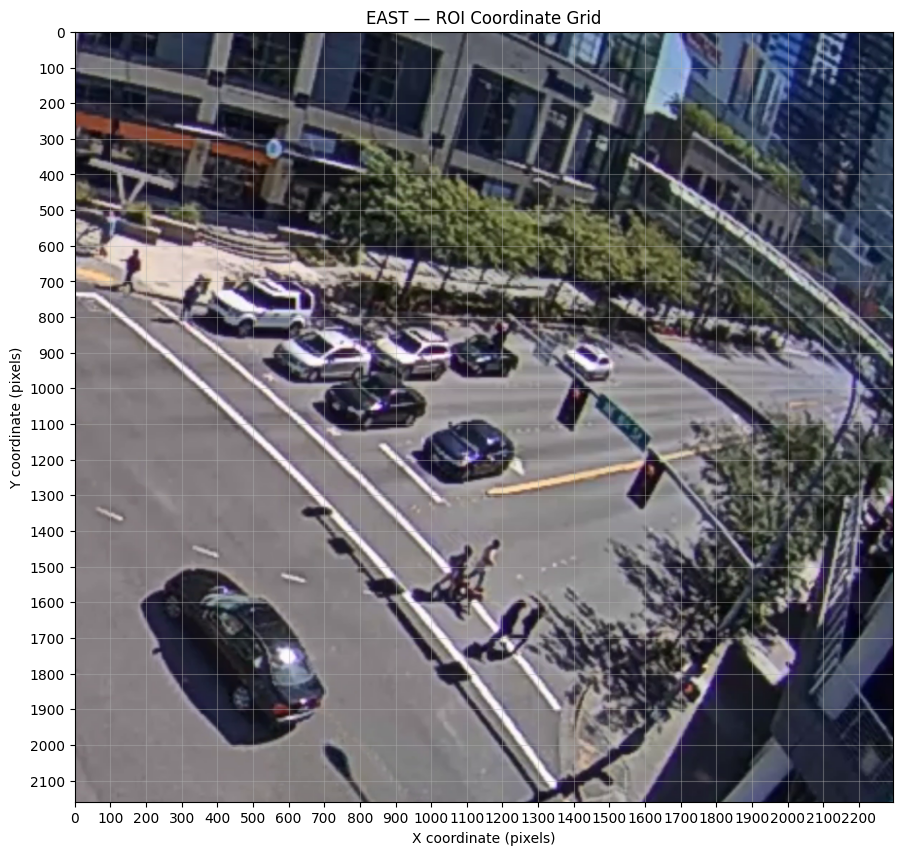

In [ ]:
# Display East video frame with coordinate grid

east_path = video_paths["east"]

cap = cv2.VideoCapture(east_path)

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
middle_frame = total_frames // 2

cap.set(cv2.CAP_PROP_POS_FRAMES, middle_frame)
ret, east_frame = cap.read()

cap.release()

if not ret:
    raise RuntimeError("Could not read the east video frame.")

east_frame_rgb = cv2.cvtColor(east_frame, cv2.COLOR_BGR2RGB)

height, width = east_frame.shape[:2]

print(f"Frame size: {width} x {height}")
print(f"Frame used: {middle_frame}")

plt.figure(figsize=(16, 10))
plt.imshow(east_frame_rgb)

# Grid every 200 pixels
grid_x = 100
grid_y = 100

plt.xticks(np.arange(0, width + 1, grid_x))
plt.yticks(np.arange(0, height + 1, grid_y))

plt.grid(True, alpha=0.4)

plt.xlabel("X coordinate (pixels)")
plt.ylabel("Y coordinate (pixels)")
plt.title("EAST — ROI Coordinate Grid")

plt.show()

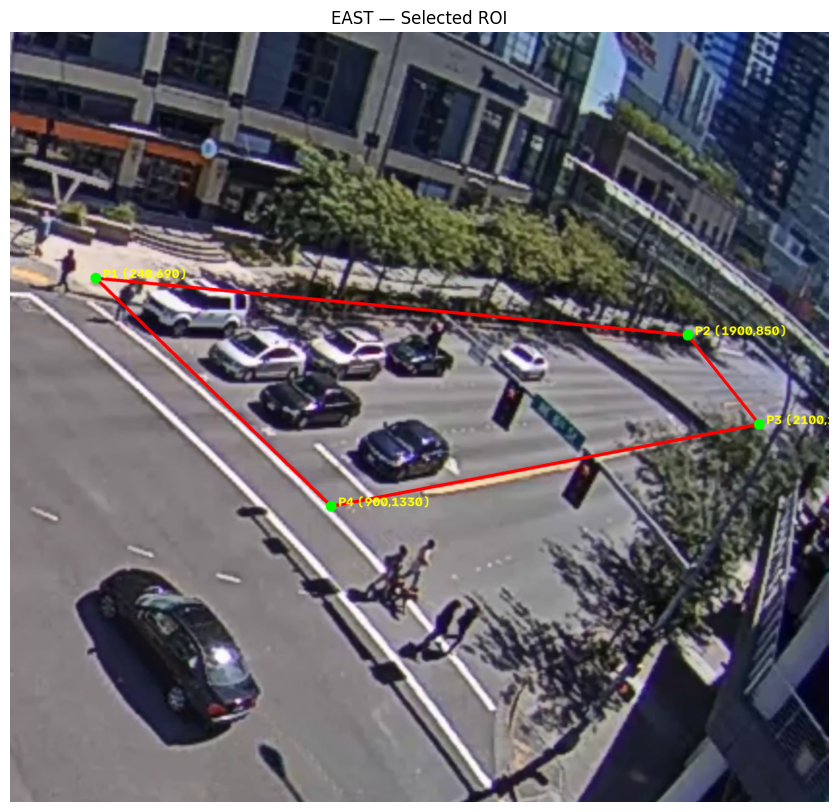

In [ ]:
east_roi = [
    (240, 690),  # top-left
    (1900, 850),  # top-right
    (2100,1100),  # bottom-right
    (900,1330)   # bottom-left
]

east_polygon = np.array(east_roi, dtype=np.int32)

east_roi_frame = east_frame_rgb.copy()

cv2.polylines(
    east_roi_frame,
    [east_polygon],
    isClosed=True,
    color=(255, 0, 0),
    thickness=8
)

for i, (x, y) in enumerate(east_roi, start=1):
    cv2.circle(
        east_roi_frame,
        (x, y),
        15,
        (0, 255, 0),
        -1
    )

    cv2.putText(
        east_roi_frame,
        f"P{i} ({x},{y})",
        (x + 20, y),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        (255, 255, 0),
        3
    )

plt.figure(figsize=(16, 10))
plt.imshow(east_roi_frame)
plt.axis("off")
plt.title("EAST — Selected ROI")
plt.show()

## ROI config

In [ ]:
# Store all four direction ROIs

roi_config = {
    "north": {
        "video": video_paths["north"],
        "roi": north_roi
    },
    "south": {
        "video": video_paths["south"],
        "roi": south_roi
    },
    "east": {
        "video": video_paths["east"],
        "roi": east_roi
    },
    "west": {
        "video": video_paths["west"],
        "roi": west_roi
    }
}

for direction, config in roi_config.items():
    print(f"\n{direction.upper()}")
    print("ROI points:", config["roi"])


NORTH
ROI points: [(600, 300), (1000, 380), (1630, 1050), (400, 1150)]

SOUTH
ROI points: [(2250, 500), (3050, 650), (2020, 1300), (580, 1200)]

EAST
ROI points: [(240, 690), (1900, 850), (2100, 1100), (900, 1330)]

WEST
ROI points: [(100, 1150), (340, 950), (1400, 1400), (700, 1990)]


In [ ]:
# The configurations are saved
# During live videos these configuration are needed to be defined and stored for each cam(approach/direction)

config_path = os.path.join(
    PROJECT_DIR,
    "cv",
    "config",
    "intersection_config.yaml"
)

intersection_config = {
    "junction_id": "J001",

    "north": {
        "video": video_paths["north"],
        "roi": [list(point) for point in north_roi]
    },

    "south": {
        "video": video_paths["south"],
        "roi": [list(point) for point in south_roi]
    },

    "east": {
        "video": video_paths["east"],
        "roi": [list(point) for point in east_roi]
    },

    "west": {
        "video": video_paths["west"],
        "roi": [list(point) for point in west_roi]
    }
}

with open(config_path, "w") as f:
    yaml.safe_dump(
        intersection_config,
        f,
        sort_keys=False
    )

print("Configuration saved to:")
print(config_path)

print("\nConfiguration:")
print(yaml.safe_dump(intersection_config, sort_keys=False))

Configuration saved to:
/content/AI_Adaptive_Traffic_Analysis_and_Signal_Optimization/cv/config/intersection_config.yaml

Configuration:
junction_id: J001
north:
  video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/North.mp4
  roi:
  - - 600
    - 300
  - - 1000
    - 380
  - - 1630
    - 1050
  - - 400
    - 1150
south:
  video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/South.mp4
  roi:
  - - 2250
    - 500
  - - 3050
    - 650
  - - 2020
    - 1300
  - - 580
    - 1200
east:
  video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/East.mp4
  roi:
  - - 240
    - 690
  - - 1900
    - 850
  - - 2100
    - 1100
  - - 900
    - 1330
west:
  video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/West.mp4
  roi:
  - - 100
    - 1150
  - - 340
    - 950
  - - 1400
    - 1400
  - - 700
    - 1990



# YOLO module

In [ ]:
# Load existing YOLO detector module

detector_path = os.path.join(
    PROJECT_DIR,
    "cv",
    "detection",
    "detector.py"
)

spec = importlib.util.spec_from_file_location(
    "detector",
    detector_path
)

detector = importlib.util.module_from_spec(spec)
spec.loader.exec_module(detector)

# Load YOLO model
model, device = detector.load_model()

print("YOLO detector loaded successfully")
print("Device:", device)
print("Vehicle classes:", detector.VEHICLE_CLASSES)

YOLO detector loaded successfully
Device: cpu
Vehicle classes: {2: 'car', 3: 'motorcycle', 5: 'bus', 7: 'truck'}


# Tracking module

In [ ]:
# Load existing tracking module

tracker_path = os.path.join(
    PROJECT_DIR,
    "cv",
    "tracking",
    "tracker.py"
)

spec = importlib.util.spec_from_file_location(
    "tracker",
    tracker_path
)

tracker = importlib.util.module_from_spec(spec)
spec.loader.exec_module(tracker)

print("Tracking module loaded successfully")
print("Function:", tracker.track_vehicles)

Tracking module loaded successfully
Function: <function track_vehicles at 0x7818f80f5580>


In [ ]:
# Reusable YOLO + ByteTrack function

def run_tracking_for_direction(direction):


    video_path = roi_config[direction]["video"]

    print(f"\nProcessing: {direction.upper()}")
    print(f"Video: {video_path}")

    results = tracker.track_vehicles(
        video_path=video_path,
        model=model,
        classes=detector.VEHICLE_CLASSES,
        tracker="bytetrack.yaml",
        conf=0.35
    )

    rows = []

    for frame_idx, result in enumerate(results):

        if result.boxes is None or result.boxes.id is None:
            continue

        boxes = result.boxes.xyxy.cpu().numpy()
        track_ids = result.boxes.id.cpu().numpy().astype(int)
        classes = result.boxes.cls.cpu().numpy().astype(int)

        for box, track_id, cls_id in zip(
            boxes, track_ids, classes
        ):

            x1, y1, x2, y2 = box

            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2

            rows.append({
                "frame": frame_idx,
                "track_id": track_id,
                "class": detector.VEHICLE_CLASSES[cls_id],
                "center_x": center_x,
                "center_y": center_y
            })

    df = pd.DataFrame(rows)

    print(f"Tracking rows : {len(df)}")
    print(f"Unique vehicles: {df['track_id'].nunique()}")

    return df

# Tacking Visualization function

In [ ]:
def show_sample_tracking_frames(direction, video_path, model, n_frames=2):
    sample_results = tracker.track_vehicles(video_path, model, detector.VEHICLE_CLASSES)
    shown = 0
    for r in sample_results:
        annotated = r.plot()
        plt.figure(figsize=(10,6))
        plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title(f"{direction.capitalize()} — Detection + Tracking (sample frame)")
        plt.show()
        shown += 1
        if shown >= n_frames:
            break

# ROI module

In [ ]:
# Load ROI module

roi_path = os.path.join(PROJECT_DIR, "cv", "traffic", "roi.py")

spec = importlib.util.spec_from_file_location("roi_module", roi_path)
roi_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(roi_module)

print("ROI module loaded successfully.")

ROI module loaded successfully.


# Speed module

In [ ]:
# Load speed module

speed_path = os.path.join(PROJECT_DIR, "cv", "traffic", "speed.py")

spec = importlib.util.spec_from_file_location("speed_module", speed_path)
speed_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(speed_module)

print("Speed module loaded successfully.")

Speed module loaded successfully.


# Queue module

In [ ]:
# queue detection

queue_path = os.path.join(PROJECT_DIR, "cv", "traffic", "queue.py")

spec = importlib.util.spec_from_file_location("queue_module", queue_path)
queue_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(queue_module)

print("Queue module loaded successfully.")

Queue module loaded successfully.


##TEST NORTH

In [ ]:
# Test tracking on North

df_north = run_tracking_for_direction("north")

print("\nNorth tracking DataFrame:")
display(df_north.head())


Processing: NORTH
Video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/North.mp4
Tracking rows : 7987
Unique vehicles: 74

North tracking DataFrame:


,frame,track_id,class,center_x,center_y
0,0,1,car,1605.666870,1406.077637
1,0,2,car,1968.774536,1247.687744
2,0,3,car,889.959412,657.407959
3,0,4,car,936.122559,1515.939941
4,0,5,car,832.200562,506.604797


In [ ]:
df_north_roi = roi_module.assign_roi_and_direction(
    df_north,
    roi_config["north"]["roi"],
    "north"
)

print("Original tracking rows :", len(df_north))
print("Rows inside North ROI  :", len(df_north_roi))
print("Unique vehicles in ROI :", df_north_roi["track_id"].nunique())

display(df_north_roi.head())

Original tracking rows : 7987
Rows inside North ROI  : 5547
Unique vehicles in ROI : 38


,frame,track_id,class,center_x,center_y,in_roi,direction
2,0,3,car,889.959412,657.407959,True,north
4,0,5,car,832.200562,506.604797,True,north
7,1,3,car,890.909302,659.060791,True,north
9,1,5,car,830.855713,508.265320,True,north
12,2,3,car,891.635742,660.811157,True,north


In [ ]:
# Check simultaneous vehicles inside North ROI

vehicles_per_frame = (
    df_north_roi
    .groupby("frame")["track_id"]
    .nunique()
)

print("Maximum vehicles simultaneously in ROI:",
      vehicles_per_frame.max())

print("\nAverage vehicles simultaneously in ROI:",
      vehicles_per_frame.mean())

print("\nFrames analyzed:",
      len(vehicles_per_frame))

print("\nFrames with highest vehicle count:")
display(
    vehicles_per_frame
    .sort_values(ascending=False)
    .head(10)
)

Maximum vehicles simultaneously in ROI: 11

Average vehicles simultaneously in ROI: 6.009750812567714

Frames analyzed: 923

Frames with highest vehicle count:


,track_id
frame,
654,11
653,11
639,11
641,11
630,11
629,11
624,10
667,10
634,10


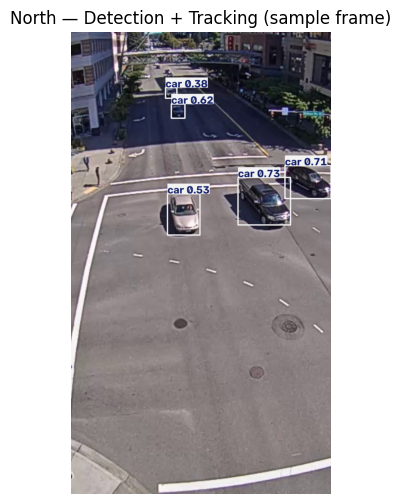

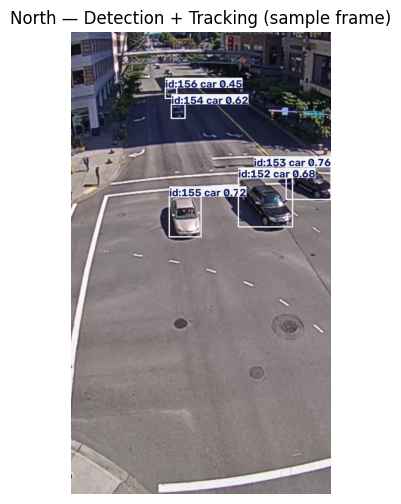

In [ ]:
# Visualize vehicle
show_sample_tracking_frames("north", roi_config["north"]["video"], model, n_frames=2)

In [ ]:
# Resolve vehicle classes

df_north_roi = roi_module.resolve_vehicle_class(df_north_roi)

print("Resolved vehicle classes:")
print(df_north_roi["resolved_class"].value_counts())

print("\nSample:")
display(
    df_north_roi[
        ["frame", "track_id", "class", "resolved_class"]
    ].head(10)
)

Resolved vehicle classes:
resolved_class
car    5547
Name: count, dtype: int64

Sample:


,frame,track_id,class,resolved_class
2,0,3,car,car
4,0,5,car,car
7,1,3,car,car
9,1,5,car,car
12,2,3,car,car
14,2,5,car,car
17,3,3,car,car
19,3,5,car,car
22,4,3,car,car
24,4,5,car,car


In [ ]:
# Calculate North vehicle speeds

df_north_speed = speed_module.compute_pixel_speed(
    df_north_roi,
    fps=30,
    max_frame_gap=5
)

print("Speed dataframe shape:", df_north_speed.shape)
print("Unique vehicles with speed data:",
      df_north_speed["track_id"].nunique())

display(
    df_north_speed[
        [
            "frame",
            "track_id",
            "center_x",
            "center_y",
            "pixel_displacement",
            "time_delta",
            "pixel_speed"
        ]
    ].head(10)
)

Speed dataframe shape: (5479, 15)
Unique vehicles with speed data: 37


,frame,track_id,center_x,center_y,pixel_displacement,time_delta,pixel_speed
7,1,3,890.909302,659.060791,1.906343,0.033333,57.190300
12,2,3,891.635742,660.811157,1.895125,0.033333,56.853740
17,3,3,892.230713,663.764648,3.012823,0.033333,90.384679
22,4,3,892.683960,668.683044,4.939236,0.033333,148.177071
27,5,3,893.289307,674.345215,5.694438,0.033333,170.833125
32,6,3,894.870117,676.593628,2.748513,0.033333,82.455389
37,7,3,895.195801,677.580444,1.039171,0.033333,31.175129
42,8,3,896.928223,681.948547,4.699107,0.033333,140.973215
47,9,3,898.398926,685.128723,3.503782,0.033333,105.113447
52,10,3,899.292175,688.275818,3.271406,0.033333,98.142192


In [ ]:
# Inspect North speed distribution

print("Pixel speed statistics:")
print(df_north_speed["pixel_speed"].describe())

print("\nSpeed percentiles:")
print(
    df_north_speed["pixel_speed"]
    .quantile([0.10, 0.25, 0.50, 0.75, 0.90])
)

Pixel speed statistics:
count    5479.000000
mean       42.547784
std        53.796458
min         0.099029
25%         8.356080
50%        23.299942
75%        56.601629
max       645.889149
Name: pixel_speed, dtype: float64

Speed percentiles:
0.10      4.051147
0.25      8.356080
0.50     23.299942
0.75     56.601629
0.90    103.090825
Name: pixel_speed, dtype: float64


In [ ]:
# Detect persistent queued vehicles

df_north_queued = queue_module.detect_queued_vehicles(
    df_north_speed,
    speed_threshold=20,
    min_queue_duration=1.0,
    fps=30,
    max_frame_gap=5
)

north_queue_length = queue_module.estimate_queue_length(
    df_north_queued
)

print("Queue runs detected :", len(df_north_queued))
print("North queue length  :", north_queue_length)

display(df_north_queued.head(10))

Queue runs detected : 8
North queue length  : 5


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
17,5,172,205,235,31,1.000000
18,5,173,237,267,31,1.000000
60,8,216,387,417,31,1.000000
168,11,222,397,449,53,1.733333
187,11,262,621,651,31,1.000000
188,11,263,653,683,31,1.000000
366,21,124,462,524,56,2.066667
624,109,20,754,791,34,1.233333


In [ ]:
# Inspect North queue detections

print("Queue runs detected:", len(df_north_queued))
print("Unique queued vehicles:",
      df_north_queued["track_id"].nunique())

if not df_north_queued.empty:
    print("\nQueue duration statistics:")
    print(df_north_queued["duration_seconds"].describe())

    print("\nLongest queue runs:")
    display(
        df_north_queued
        .sort_values("duration_seconds", ascending=False)
        .head(10)
    )
else:
    print("No persistent queued vehicles detected.")

Queue runs detected: 8
Unique queued vehicles: 5

Queue duration statistics:
count    8.000000
mean     1.254167
std      0.416309
min      1.000000
25%      1.000000
50%      1.000000
75%      1.358333
max      2.066667
Name: duration_seconds, dtype: float64

Longest queue runs:


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
366,21,124,462,524,56,2.066667
168,11,222,397,449,53,1.733333
624,109,20,754,791,34,1.233333
17,5,172,205,235,31,1.000000
60,8,216,387,417,31,1.000000
18,5,173,237,267,31,1.000000
188,11,263,653,683,31,1.000000
187,11,262,621,651,31,1.000000


In [ ]:
#Representative speed per vehicle

north_vehicle_speeds = speed_module.representative_vehicle_speeds(
    df_north_speed,
    min_observations=10,
    smoothing_window=5
)

print("Vehicles with representative speed:",
      len(north_vehicle_speeds))

print("\nRepresentative speed statistics:")
print(north_vehicle_speeds["representative_pixel_speed"].describe())

display(north_vehicle_speeds.head(10))

Vehicles with representative speed: 28

Representative speed statistics:
count     28.000000
mean      37.395112
std       25.927980
min        5.716760
25%       15.578711
50%       31.626605
75%       50.793648
max      105.700865
Name: representative_pixel_speed, dtype: float64


,representative_pixel_speed,observations
track_id,,
3,90.384679,87
5,30.041989,349
8,24.756303,837
10,51.367922,39
11,12.364345,825
14,105.700865,123
17,46.463792,124
18,24.151540,470
20,40.932802,114


In [ ]:
north_class_counts = (
    df_north_roi
    .groupby("track_id")["resolved_class"]
    .first()
    .value_counts()
)

print("NORTH VEHICLE CLASSES")
print(north_class_counts)

north_cars = int(north_class_counts.get("car", 0))
north_buses = int(north_class_counts.get("bus", 0))
north_trucks = int(north_class_counts.get("truck", 0))
north_motorcycles = int(north_class_counts.get("motorcycle", 0))

NORTH VEHICLE CLASSES
resolved_class
car    38
Name: count, dtype: int64


In [ ]:
north_average_speed =  north_vehicle_speeds["representative_pixel_speed"].median()

print("North average speed (px/s):", round(north_average_speed, 2))

North average speed (px/s): 31.63


In [ ]:
north_summary = {
    "direction": "north",
    "vehicles_detected": int(df_north_roi["track_id"].nunique()),
    "cars": north_cars,
    "buses": north_buses,
    "trucks": north_trucks,
    "motorcycles": north_motorcycles,
    "vehicles_with_speed": int(len(north_vehicle_speeds)),
    "average_speed_pixel_per_sec": round(float(north_average_speed), 2),
    "queue_length": int(north_queue_length)
}

print(north_summary)

{'direction': 'north', 'vehicles_detected': 38, 'cars': 38, 'buses': 0, 'trucks': 0, 'motorcycles': 0, 'vehicles_with_speed': 28, 'average_speed_pixel_per_sec': 31.63, 'queue_length': 5}


##TEST SOUTH

In [ ]:

# South YOLO + ByteTrack

df_south = run_tracking_for_direction("south")

print("\nSouth tracking complete.")
print("DataFrame shape:", df_south.shape)
print("Unique vehicles:", df_south["track_id"].nunique())


Processing: SOUTH
Video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/South.mp4
Tracking rows : 1812
Unique vehicles: 40

South tracking complete.
DataFrame shape: (1812, 5)
Unique vehicles: 40


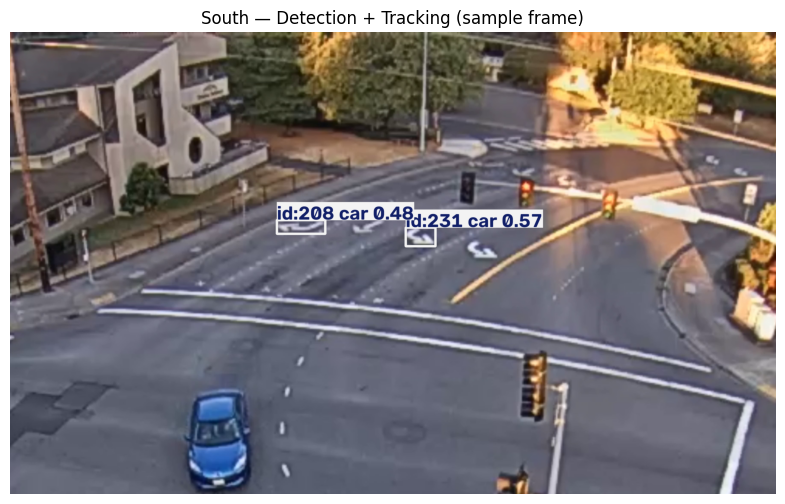

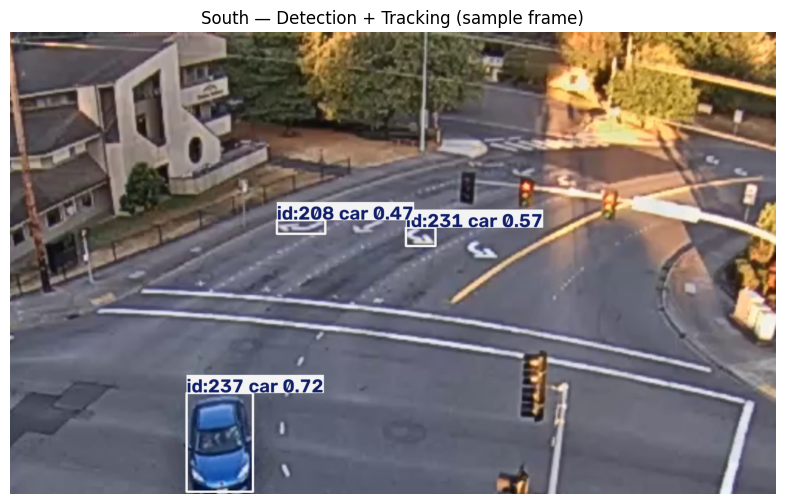

In [ ]:
# Visulaize south tracking
show_sample_tracking_frames("south", roi_config["south"]["video"], model, n_frames=2)

In [ ]:
#  South ROI filtering

df_south_roi = roi_module.assign_roi_and_direction(
    df_south,
    roi_config["south"]["roi"],
    "south"
)

print("SOUTH ROI RESULTS")
print("-----------------")
print("Original tracking rows :", len(df_south))
print("Rows inside ROI        :", len(df_south_roi))
print("Unique vehicles in ROI :", df_south_roi["track_id"].nunique())

SOUTH ROI RESULTS
-----------------
Original tracking rows : 1812
Rows inside ROI        : 1124
Unique vehicles in ROI : 16


In [ ]:
# Resolve South vehicle classes

df_south_roi = roi_module.resolve_vehicle_class(
    df_south_roi
)

south_class_counts = (
    df_south_roi
    .groupby("track_id")["resolved_class"]
    .first()
    .value_counts()
)

print("SOUTH VEHICLE CLASSES")
print("---------------------")
print(south_class_counts)

print("\nTotal unique vehicles:",
      df_south_roi["track_id"].nunique())

SOUTH VEHICLE CLASSES
---------------------
resolved_class
car      15
truck     1
Name: count, dtype: int64

Total unique vehicles: 16


In [ ]:
#  South speed calculation

south_fps = roi_config["south"].get("fps", None)

if south_fps is None:
    import cv2

    cap = cv2.VideoCapture(
        roi_config["south"]["video"]
    )

    south_fps = cap.get(cv2.CAP_PROP_FPS)

    cap.release()

print("South FPS:", south_fps)

df_south_speed = speed_module.compute_pixel_speed(
    df_south_roi,
    fps=south_fps,
    max_frame_gap=5
)

print("\nSouth speed data")
print("----------------")
print("Rows:", len(df_south_speed))
print(
    "Vehicles with speed data:",
    df_south_speed["track_id"].nunique()
)

display(df_south_speed.head())

South FPS: 25.0

South speed data
----------------
Rows: 1095
Vehicles with speed data: 15


,frame,track_id,class,center_x,center_y,in_roi,direction,resolved_class,time_seconds,delta_x,delta_y,pixel_displacement,frame_gap,time_delta,pixel_speed
4,2,158,car,1919.944092,957.692993,True,south,car,0.08,-0.001465,0.005493,0.005685,1.0,0.04,0.142128
7,3,158,car,1919.938599,957.721924,True,south,car,0.12,-0.005493,0.028931,0.029448,1.0,0.04,0.736189
10,4,158,car,1919.926514,957.744751,True,south,car,0.16,-0.012085,0.022827,0.025829,1.0,0.04,0.645719
13,5,158,car,1919.911865,957.780273,True,south,car,0.20,-0.014648,0.035522,0.038424,1.0,0.04,0.960606
16,6,158,car,1919.907959,957.804321,True,south,car,0.24,-0.003906,0.024048,0.024363,1.0,0.04,0.609076


In [ ]:
# Detect persistent queued vehicles

df_south_queued = queue_module.detect_queued_vehicles(
    df_south_speed,
    speed_threshold=20,
    min_queue_duration=1.0,
    fps=25,
    max_frame_gap=5
)

south_queue_length = queue_module.estimate_queue_length(
    df_south_queued
)

print("Queue runs detected :", len(df_north_queued))
print("South queue length  :", south_queue_length)

display(df_south_queued.head(10))

Queue runs detected : 8
South queue length  : 6


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
1,158,2,22,47,26,1.00
2,158,3,49,100,52,2.04
3,158,4,102,154,53,2.08
7,158,8,208,260,53,2.08
8,158,9,262,367,106,4.20
10,158,11,396,425,30,1.16
13,180,1,230,260,24,1.20
24,206,2,511,555,45,1.76
26,206,4,582,634,52,2.08
36,208,1,506,584,76,3.12


In [ ]:
# Inspect South queue detections

print("Queue runs detected:", len(df_south_queued))
print("Unique queued vehicles:",
      df_south_queued["track_id"].nunique())

if not df_south_queued.empty:
    print("\nQueue duration statistics:")
    print(df_south_queued["duration_seconds"].describe())

    print("\nLongest queue runs:")
    display(
        df_south_queued
        .sort_values("duration_seconds", ascending=False)
        .head(10)
    )
else:
    print("No persistent queued vehicles detected.")

Queue runs detected: 14
Unique queued vehicles: 6

Queue duration statistics:
count    14.000000
mean      1.937143
std       0.933969
min       1.000000
25%       1.200000
50%       1.900000
75%       2.080000
max       4.200000
Name: duration_seconds, dtype: float64

Longest queue runs:


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
8,158,9,262,367,106,4.20
36,208,1,506,584,76,3.12
46,209,1,506,578,71,2.88
26,206,4,582,634,52,2.08
7,158,8,208,260,53,2.08
3,158,4,102,154,53,2.08
2,158,3,49,100,52,2.04
24,206,2,511,555,45,1.76
53,224,6,716,749,34,1.32
13,180,1,230,260,24,1.20


In [ ]:
#Representative speed per vehicle

south_vehicle_speeds = speed_module.representative_vehicle_speeds(
    df_south_speed,
    min_observations=10,
    smoothing_window=5
)

print("Vehicles with representative speed:",
      len(south_vehicle_speeds))

print("\nRepresentative speed statistics:")
print(south_vehicle_speeds["representative_pixel_speed"].describe())

display(south_vehicle_speeds.head(10))

Vehicles with representative speed: 11

Representative speed statistics:
count     11.000000
mean      19.507250
std       58.620254
min        0.071244
25%        1.173457
50%        1.895375
75%        2.531187
max      196.204567
Name: representative_pixel_speed, dtype: float64


,representative_pixel_speed,observations
track_id,,
158,0.999272,402
159,0.306044,19
180,1.575448,40
189,1.985168,15
200,1.347642,18
201,3.077205,14
206,1.940066,186
208,1.895375,184
209,0.071244,75


In [ ]:
south_class_counts = (
    df_south_roi
    .groupby("track_id")["resolved_class"]
    .first()
    .value_counts()
)

print("SOUTH VEHICLE CLASSES")
print(south_class_counts)

south_cars = int(south_class_counts.get("car", 0))
south_buses = int(south_class_counts.get("bus", 0))
south_trucks = int(south_class_counts.get("truck", 0))
south_motorcycles = int(south_class_counts.get("motorcycle", 0))

SOUTH VEHICLE CLASSES
resolved_class
car      15
truck     1
Name: count, dtype: int64


In [ ]:
south_average_speed =  south_vehicle_speeds["representative_pixel_speed"].median()

print("South average speed (px/s):", south_average_speed, 2)

South average speed (px/s): 1.895374990999739 2


In [ ]:
south_summary = {
    "direction": "south",
    "vehicles_detected": int(df_south_roi["track_id"].nunique()),
    "cars": south_cars,
    "buses": south_buses,
    "trucks": south_trucks,
    "motorcycles": south_motorcycles,
    "vehicles_with_speed": int(len(south_vehicle_speeds)),
    "average_speed_pixel_per_sec": round(float(south_average_speed), 2),
    "queue_length": int(south_queue_length)
}

print(south_summary)

{'direction': 'south', 'vehicles_detected': 16, 'cars': 15, 'buses': 0, 'trucks': 1, 'motorcycles': 0, 'vehicles_with_speed': 11, 'average_speed_pixel_per_sec': 1.9, 'queue_length': 6}


##TEST WEST

In [ ]:

# West YOLO + ByteTrack

df_west = run_tracking_for_direction("west")

print("\nWest tracking complete.")
print("DataFrame shape:", df_west.shape)
print("Unique vehicles:", df_west["track_id"].nunique())


Processing: WEST
Video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/West.mp4
Tracking rows : 3441
Unique vehicles: 22

West tracking complete.
DataFrame shape: (3441, 5)
Unique vehicles: 22


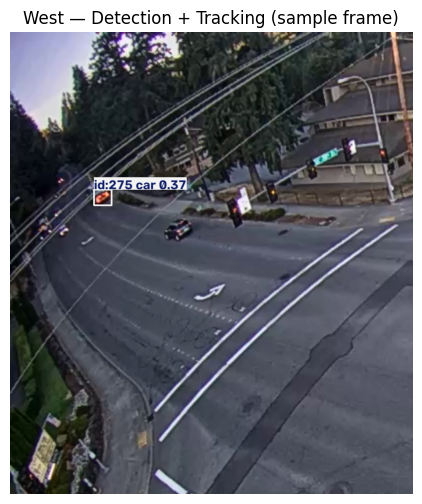

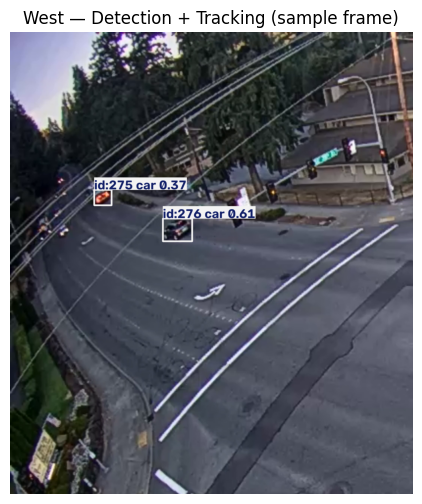

In [ ]:
# Visulaize west tracking
show_sample_tracking_frames("west", roi_config["west"]["video"], model, n_frames=2)

In [ ]:
#  West ROI filtering

df_west_roi = roi_module.assign_roi_and_direction(
    df_west,
    roi_config["west"]["roi"],
    "west"
)

print("WEST ROI RESULTS")
print("-----------------")
print("Original tracking rows :", len(df_west))
print("Rows inside ROI        :", len(df_west_roi))
print("Unique vehicles in ROI :", df_west_roi["track_id"].nunique())

WEST ROI RESULTS
-----------------
Original tracking rows : 3441
Rows inside ROI        : 3290
Unique vehicles in ROI : 14


In [ ]:
# Resolve West vehicle classes

df_west_roi = roi_module.resolve_vehicle_class(
    df_west_roi
)

west_class_counts = (
    df_west_roi
    .groupby("track_id")["resolved_class"]
    .first()
    .value_counts()
)

print("WEST VEHICLE CLASSES")
print("---------------------")
print(west_class_counts)

print("\nTotal unique vehicles:",
      df_west_roi["track_id"].nunique())

WEST VEHICLE CLASSES
---------------------
resolved_class
car    14
Name: count, dtype: int64

Total unique vehicles: 14


In [ ]:
#  West speed calculation

west_fps = roi_config["west"].get("fps", None)

if west_fps is None:
    import cv2

    cap = cv2.VideoCapture(
        roi_config["west"]["video"]
    )

    west_fps = cap.get(cv2.CAP_PROP_FPS)

    cap.release()

print("West FPS:", west_fps)

df_west_speed = speed_module.compute_pixel_speed(
    df_west_roi,
    fps=west_fps,
    max_frame_gap=5
)

print("\nWest speed data")
print("----------------")
print("Rows:", len(df_west_speed))
print(
    "Vehicles with speed data:",
    df_west_speed["track_id"].nunique()
)

display(df_west_speed.head())

West FPS: 25.0

West speed data
----------------
Rows: 3263
Vehicles with speed data: 13


,frame,track_id,class,center_x,center_y,in_roi,direction,resolved_class,time_seconds,delta_x,delta_y,pixel_displacement,frame_gap,time_delta,pixel_speed
45,65,242,car,390.104370,1225.956055,True,west,car,2.60,1.101379,1.063354,1.530934,1.0,0.04,38.273352
49,66,242,car,392.358521,1230.355835,True,west,car,2.64,2.254150,4.399780,4.943608,1.0,0.04,123.590195
53,67,242,car,395.022156,1232.929199,True,west,car,2.68,2.663635,2.573364,3.703668,1.0,0.04,92.591697
57,68,242,car,397.055481,1235.260498,True,west,car,2.72,2.033325,2.331299,3.093439,1.0,0.04,77.335978
62,69,242,car,399.996216,1237.850342,True,west,car,2.76,2.940735,2.589844,3.918573,1.0,0.04,97.964317


In [ ]:
# Detect persistent queued vehicles

df_west_queued = queue_module.detect_queued_vehicles(
    df_west_speed,
    speed_threshold=20,
    min_queue_duration=1.0,
    fps=25,
    max_frame_gap=5
)

west_queue_length = queue_module.estimate_queue_length(
    df_west_queued
)

print("Queue runs detected :", len(df_west_queued))
print("West queue length  :", west_queue_length)

display(df_west_queued.head(10))

Queue runs detected : 19
West queue length  : 7


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
17,242,206,357,382,26,1.00
20,242,209,391,462,72,2.84
23,242,212,481,595,115,4.56
25,242,214,601,648,48,1.88
26,242,215,650,702,53,2.08
64,244,259,570,595,26,1.00
127,251,104,411,462,52,2.04
130,251,107,490,515,26,1.00
132,251,109,541,595,55,2.16
138,251,117,661,702,42,1.64


In [ ]:
# Inspect West queue detections

print("Queue runs detected:", len(df_west_queued))
print("Unique queued vehicles:",
      df_west_queued["track_id"].nunique())

if not df_west_queued.empty:
    print("\nQueue duration statistics:")
    print(df_west_queued["duration_seconds"].describe())

    print("\nLongest queue runs:")
    display(
        df_west_queued
        .sort_values("duration_seconds", ascending=False)
        .head(10)
    )
else:
    print("No persistent queued vehicles detected.")

Queue runs detected: 19
Unique queued vehicles: 7

Queue duration statistics:
count    19.000000
mean      1.673684
std       0.890370
min       1.000000
25%       1.000000
50%       1.400000
75%       2.040000
max       4.560000
Name: duration_seconds, dtype: float64

Longest queue runs:


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
23,242,212,481,595,115,4.56
20,242,209,391,462,72,2.84
132,251,109,541,595,55,2.16
26,242,215,650,702,53,2.08
127,251,104,411,462,52,2.04
228,272,2,597,648,52,2.04
176,261,39,601,648,48,1.88
25,242,214,601,648,48,1.88
138,251,117,661,702,42,1.64
213,271,4,544,579,36,1.40


In [ ]:
#Representative speed per vehicle

west_vehicle_speeds = speed_module.representative_vehicle_speeds(
    df_west_speed,
    min_observations=10,
    smoothing_window=5
)

print("Vehicles with representative speed:",
      len(west_vehicle_speeds))

print("\nRepresentative speed statistics:")
print(west_vehicle_speeds["representative_pixel_speed"].describe())

display(west_vehicle_speeds.head(10))

Vehicles with representative speed: 11

Representative speed statistics:
count     11.000000
mean      23.371018
std       33.414263
min        0.676068
25%        1.972783
50%        5.353613
75%       34.307835
max      104.833233
Name: representative_pixel_speed, dtype: float64


,representative_pixel_speed,observations
track_id,,
242,2.433753,686
244,9.720401,656
248,104.833233,10
250,40.962288,195
251,5.353613,528
256,59.991667,94
257,1.511813,37
261,3.011514,453
265,27.653381,185


In [ ]:
west_class_counts = (
    df_west_roi
    .groupby("track_id")["resolved_class"]
    .first()
    .value_counts()
)

print("WEST VEHICLE CLASSES")
print(west_class_counts)

west_cars = int(west_class_counts.get("car", 0))
west_buses = int(west_class_counts.get("bus", 0))
west_trucks = int(west_class_counts.get("truck", 0))
west_motorcycles = int(west_class_counts.get("motorcycle", 0))

WEST VEHICLE CLASSES
resolved_class
car    14
Name: count, dtype: int64


In [ ]:
west_average_speed =  west_vehicle_speeds["representative_pixel_speed"].median()

print("West average speed (px/s):", west_average_speed, 2)

West average speed (px/s): 5.353613197803136 2


In [ ]:
west_summary = {
    "direction": "west",
    "vehicles_detected": int(df_west_roi["track_id"].nunique()),
    "cars": west_cars,
    "buses": west_buses,
    "trucks": west_trucks,
    "motorcycles": west_motorcycles,
    "vehicles_with_speed": int(len(west_vehicle_speeds)),
    "average_speed_pixel_per_sec": round(float(west_average_speed), 2),
    "queue_length": int(west_queue_length)
}

print(west_summary)

{'direction': 'west', 'vehicles_detected': 14, 'cars': 14, 'buses': 0, 'trucks': 0, 'motorcycles': 0, 'vehicles_with_speed': 11, 'average_speed_pixel_per_sec': 5.35, 'queue_length': 7}


##TEST EAST

In [ ]:

# east YOLO + ByteTrack

df_east = run_tracking_for_direction("east")

print("\neast tracking complete.")
print("DataFrame shape:", df_east.shape)
print("Unique vehicles:", df_east["track_id"].nunique())


Processing: EAST
Video: /content/drive/MyDrive/Colab Notebooks/Datasets /Capstone_traffic/Demo/East.mp4
Tracking rows : 4765
Unique vehicles: 45

east tracking complete.
DataFrame shape: (4765, 5)
Unique vehicles: 45


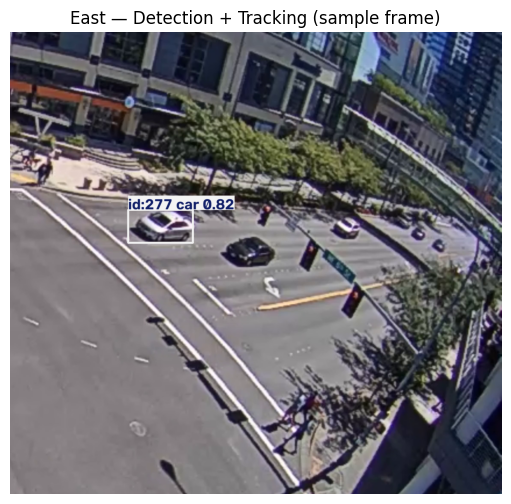

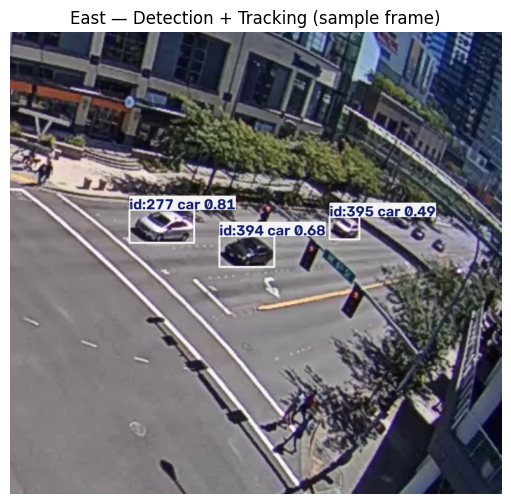

In [ ]:
# Visulaize west tracking
show_sample_tracking_frames("east", roi_config["east"]["video"], model, n_frames=2)

In [ ]:
#  East ROI filtering

df_east_roi = roi_module.assign_roi_and_direction(
    df_east,
    roi_config["east"]["roi"],
    "east"
)

print("east ROI RESULTS")
print("-----------------")
print("Original tracking rows :", len(df_east))
print("Rows inside ROI        :", len(df_east_roi))
print("Unique vehicles in ROI :", df_east_roi["track_id"].nunique())

east ROI RESULTS
-----------------
Original tracking rows : 4765
Rows inside ROI        : 3993
Unique vehicles in ROI : 17


In [ ]:
# Resolve East vehicle classes

df_east_roi = roi_module.resolve_vehicle_class(
    df_east_roi
)

east_class_counts = (
    df_east_roi
    .groupby("track_id")["resolved_class"]
    .first()
    .value_counts()
)

print("east VEHICLE CLASSES")
print("---------------------")
print(east_class_counts)

print("\nTotal unique vehicles:",
      df_east_roi["track_id"].nunique())

east VEHICLE CLASSES
---------------------
resolved_class
car    17
Name: count, dtype: int64

Total unique vehicles: 17


In [ ]:
#  East speed calculation

east_fps = roi_config["east"].get("fps", None)

if east_fps is None:
    import cv2

    cap = cv2.VideoCapture(
        roi_config["east"]["video"]
    )

    east_fps = cap.get(cv2.CAP_PROP_FPS)

    cap.release()

print("east FPS:", east_fps)

df_east_speed = speed_module.compute_pixel_speed(
    df_east_roi,
    fps=east_fps,
    max_frame_gap=5
)

print("\neast speed data")
print("----------------")
print("Rows:", len(df_east_speed))
print(
    "Vehicles with speed data:",
    df_east_speed["track_id"].nunique()
)

display(df_east_speed.head())

east FPS: 25.0

east speed data
----------------
Rows: 3953
Vehicles with speed data: 15


,frame,track_id,class,center_x,center_y,in_roi,direction,resolved_class,time_seconds,delta_x,delta_y,pixel_displacement,frame_gap,time_delta,pixel_speed
3,2,277,car,710.018799,907.899536,True,east,car,0.08,-1.205994,-0.163940,1.217085,1.0,0.04,30.427137
6,3,277,car,708.695190,907.692627,True,east,car,0.12,-1.323608,-0.206909,1.339683,1.0,0.04,33.492076
9,4,277,car,706.220459,907.748657,True,east,car,0.16,-2.474731,0.056030,2.475366,1.0,0.04,61.884141
12,5,277,car,700.279114,907.807129,True,east,car,0.20,-5.941345,0.058472,5.941633,1.0,0.04,148.540819
16,6,277,car,697.001099,907.833374,True,east,car,0.24,-3.278015,0.026245,3.278120,1.0,0.04,81.953007


In [ ]:
# Detect persistent queued vehicles

df_east_queued = queue_module.detect_queued_vehicles(
    df_east_speed,
    speed_threshold=20,
    min_queue_duration=1.0,
    fps=25,
    max_frame_gap=5
)

east_queue_length = queue_module.estimate_queue_length(
    df_east_queued
)

print("Queue runs detected :", len(df_east_queued))
print("east queue length  :", east_queue_length)

display(df_east_queued.head(10))

Queue runs detected : 21
east queue length  : 5


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
48,277,171,297,326,30,1.16
50,277,174,341,393,53,2.08
52,277,176,421,473,53,2.08
63,277,192,541,599,59,2.32
65,277,194,608,659,52,2.04
66,277,195,661,686,26,1.00
189,279,182,421,449,29,1.12
207,279,216,636,686,51,2.00
271,348,89,395,449,55,2.16
272,348,90,451,484,34,1.32


In [ ]:
# Inspect West queue detections

print("Queue runs detected:", len(df_west_queued))
print("Unique queued vehicles:",
      df_west_queued["track_id"].nunique())

if not df_west_queued.empty:
    print("\nQueue duration statistics:")
    print(df_west_queued["duration_seconds"].describe())

    print("\nLongest queue runs:")
    display(
        df_west_queued
        .sort_values("duration_seconds", ascending=False)
        .head(10)
    )
else:
    print("No persistent queued vehicles detected.")

Queue runs detected: 19
Unique queued vehicles: 7

Queue duration statistics:
count    19.000000
mean      1.673684
std       0.890370
min       1.000000
25%       1.000000
50%       1.400000
75%       2.040000
max       4.560000
Name: duration_seconds, dtype: float64

Longest queue runs:


,track_id,run_id,start_frame,end_frame,observations,duration_seconds
23,242,212,481,595,115,4.56
20,242,209,391,462,72,2.84
132,251,109,541,595,55,2.16
26,242,215,650,702,53,2.08
127,251,104,411,462,52,2.04
228,272,2,597,648,52,2.04
176,261,39,601,648,48,1.88
25,242,214,601,648,48,1.88
138,251,117,661,702,42,1.64
213,271,4,544,579,36,1.40


In [ ]:
#Representative speed per vehicle

east_vehicle_speeds = speed_module.representative_vehicle_speeds(
    df_east_speed,
    min_observations=10,
    smoothing_window=5
)

print("Vehicles with representative speed:",
      len(east_vehicle_speeds))

print("\nRepresentative speed statistics:")
print(east_vehicle_speeds["representative_pixel_speed"].describe())

display(east_vehicle_speeds.head(10))

Vehicles with representative speed: 9

Representative speed statistics:
count     9.000000
mean     25.675441
std      31.874953
min       2.191162
25%       5.458165
50%       9.678913
75%      33.742490
max      85.661799
Name: representative_pixel_speed, dtype: float64


,representative_pixel_speed,observations
track_id,,
277,7.034246,753
278,11.858790,736
279,9.678913,710
301,33.742490,329
306,85.661799,58
348,5.458165,495
349,2.191162,495
361,72.509331,106
376,2.944077,256


In [ ]:
east_class_counts = (
    df_east_roi
    .groupby("track_id")["resolved_class"]
    .first()
    .value_counts()
)

print("east VEHICLE CLASSES")
print(east_class_counts)

east_cars = int(east_class_counts.get("car", 0))
east_buses = int(east_class_counts.get("bus", 0))
east_trucks = int(east_class_counts.get("truck", 0))
east_motorcycles = int(east_class_counts.get("motorcycle", 0))

east VEHICLE CLASSES
resolved_class
car    17
Name: count, dtype: int64


In [ ]:
east_average_speed =  east_vehicle_speeds["representative_pixel_speed"].median()

print("East average speed (px/s):", east_average_speed, 2)

East average speed (px/s): 9.678913280368057 2


In [ ]:
east_summary = {
    "direction": "east",
    "vehicles_detected": int(df_east_roi["track_id"].nunique()),
    "cars": east_cars,
    "buses": east_buses,
    "trucks": east_trucks,
    "motorcycles": east_motorcycles,
    "vehicles_with_speed": int(len(east_vehicle_speeds)),
    "average_speed_pixel_per_sec": round(float(east_average_speed), 2),
    "queue_length": int(east_queue_length)
}

print(east_summary)

{'direction': 'east', 'vehicles_detected': 17, 'cars': 17, 'buses': 0, 'trucks': 0, 'motorcycles': 0, 'vehicles_with_speed': 9, 'average_speed_pixel_per_sec': 9.68, 'queue_length': 5}


#Traffic_State

In [ ]:
# Convert existing direction summaries
# into the traffic-state format

north_state = {
    "vehicles": north_summary["vehicles_detected"],
    "cars": north_summary["cars"],
    "buses": north_summary["buses"],
    "trucks": north_summary["trucks"],
    "motorcycles": north_summary["motorcycles"],
    "average_speed": north_summary["average_speed_pixel_per_sec"],
    "queue_length": north_summary["queue_length"]
}

south_state = {
    "vehicles": south_summary["vehicles_detected"],
    "cars": south_summary["cars"],
    "buses": south_summary["buses"],
    "trucks": south_summary["trucks"],
    "motorcycles": south_summary["motorcycles"],
    "average_speed": south_summary["average_speed_pixel_per_sec"],
    "queue_length": south_summary["queue_length"]
}

east_state = {
    "vehicles": east_summary["vehicles_detected"],
    "cars": east_summary["cars"],
    "buses": east_summary["buses"],
    "trucks": east_summary["trucks"],
    "motorcycles": east_summary["motorcycles"],
    "average_speed": east_summary["average_speed_pixel_per_sec"],
    "queue_length": east_summary["queue_length"]
}

west_state = {
    "vehicles": west_summary["vehicles_detected"],
    "cars": west_summary["cars"],
    "buses": west_summary["buses"],
    "trucks": west_summary["trucks"],
    "motorcycles": west_summary["motorcycles"],
    "average_speed": west_summary["average_speed_pixel_per_sec"],
    "queue_length": west_summary["queue_length"]
}

print(north_state)
print(south_state)
print(west_state)
print(east_state)

{'vehicles': 38, 'cars': 38, 'buses': 0, 'trucks': 0, 'motorcycles': 0, 'average_speed': 31.63, 'queue_length': 5}
{'vehicles': 16, 'cars': 15, 'buses': 0, 'trucks': 1, 'motorcycles': 0, 'average_speed': 1.9, 'queue_length': 6}
{'vehicles': 14, 'cars': 14, 'buses': 0, 'trucks': 0, 'motorcycles': 0, 'average_speed': 5.35, 'queue_length': 7}
{'vehicles': 17, 'cars': 17, 'buses': 0, 'trucks': 0, 'motorcycles': 0, 'average_speed': 9.68, 'queue_length': 5}


In [ ]:
import os
import importlib.util

traffic_state_path = os.path.join(
    PROJECT_DIR,
    "cv",
    "traffic",
    "traffic_state.py"
)

spec = importlib.util.spec_from_file_location(
    "traffic_state_module",
    traffic_state_path
)

traffic_state_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(traffic_state_module)

print("traffic_state.py loaded successfully.")

traffic_state.py loaded successfully.


In [ ]:
# Build the complete traffic state

traffic_state = traffic_state_module.build_traffic_state(
    junction_id="J001",
    north=north_state,
    south=south_state,
    east=east_state,
    west=west_state
)

print("Traffic state created successfully.")

Traffic state created successfully.


In [ ]:
import json

print(json.dumps(traffic_state, indent=2))

{
  "junction_id": "J001",
  "timestamp": "2026-09-22T06:10:53+00:00",
  "north": {
    "vehicles": 38,
    "cars": 38,
    "buses": 0,
    "trucks": 0,
    "motorcycles": 0,
    "average_speed": 31.63,
    "queue_length": 5
  },
  "south": {
    "vehicles": 16,
    "cars": 15,
    "buses": 0,
    "trucks": 1,
    "motorcycles": 0,
    "average_speed": 1.9,
    "queue_length": 6
  },
  "east": {
    "vehicles": 17,
    "cars": 17,
    "buses": 0,
    "trucks": 0,
    "motorcycles": 0,
    "average_speed": 9.68,
    "queue_length": 5
  },
  "west": {
    "vehicles": 14,
    "cars": 14,
    "buses": 0,
    "trucks": 0,
    "motorcycles": 0,
    "average_speed": 5.35,
    "queue_length": 7
  }
}


In [ ]:
import json
import os

output_dir = os.path.join(
    PROJECT_DIR,
    "cv",
    "output",
    "traffic_states"
)

os.makedirs(output_dir, exist_ok=True)

output_path = os.path.join(
    output_dir,
    "traffic_state.json"
)

with open(output_path, "w") as f:
    json.dump(traffic_state, f, indent=2)

print("Saved:", output_path)

Saved: /content/AI_Adaptive_Traffic_Analysis_and_Signal_Optimization/cv/output/traffic_states/traffic_state.json
